In [9]:
from dask.distributed import Client
client = Client(scheduler_file='/proj/sahils/mpi/scheduler.json')  # set up local cluster on your laptop
client

<Client: 'tcp://203.247.189.225:33696' processes=5 threads=90, memory=419.10 GiB>

In [2]:
%matplotlib inline

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.ticker as mticker
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cf
import cmaps
from cmcrameri import cm
import glob
from tqdm.notebook import tqdm_notebook
import cartopy.feature as cfeature
import cmocean

In [3]:
import warnings
warnings.filterwarnings("ignore")

## Vertical Velocity at 100m (WVEL + WSUBM + WISOP)

In [4]:
ds2=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/UPWELLING/WVEL_1y_k11_MOAR_*.1x1_185001-250012.nc', combine='nested',concat_dim='concat_dim')
ds3=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/UPWELLING/WISOP_1y_k11_MOAR_*.1x1_185001-250012.nc', combine='nested',concat_dim='concat_dim')
ds4=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/UPWELLING/WSUBM_1y_k11_MOAR_*.1x1_185001-250012.nc', combine='nested',concat_dim='concat_dim')

ds5=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/UPWELLING/WVEL_1y_k41_MOAR_*.1x1_185001-250012.nc', combine='nested',concat_dim='concat_dim')
ds6=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/UPWELLING/WISOP_1y_k41_MOAR_*.1x1_185001-250012.nc', combine='nested',concat_dim='concat_dim')
ds7=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/UPWELLING/WSUBM_1y_k41_MOAR_*.1x1_185001-250012.nc', combine='nested',concat_dim='concat_dim')



In [10]:
wvel_ts_100m  = ds2.WVEL.groupby('time.year').mean('time').squeeze().load()
wisop_ts_100m = ds3.WISOP.groupby('time.year').mean('time').squeeze().load()
wsubm_ts_100m = ds4.WSUBM.groupby('time.year').mean('time').squeeze().load()

wvel_ts_400m  = ds5.WVEL.groupby('time.year').mean('time').squeeze().load()
wisop_ts_400m = ds6.WISOP.groupby('time.year').mean('time').squeeze().load()
wsubm_ts_400m = ds7.WSUBM.groupby('time.year').mean('time').squeeze().load()

In [11]:
wvel_tot_100m = wvel_ts_100m + wisop_ts_100m + wsubm_ts_100m
wvel_tot_400m = wvel_ts_400m + wisop_ts_400m + wsubm_ts_400m

In [12]:
area = ds2.TAREA.mean('concat_dim')*1e-4
wvel_tot_100m = wvel_tot_100m*area*1e-2

In [16]:
wvel_hist_clim100m   = wvel_tot_100m.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
wvel_nfut_clim100m   = wvel_tot_100m.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
wvel_ffut_clim100m   = wvel_tot_100m.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
wvel_dfut_clim100m   = wvel_tot_100m.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

wvel_nfut_100m = wvel_nfut_clim100m - wvel_hist_clim100m
wvel_ffut_100m = wvel_ffut_clim100m - wvel_nfut_clim100m
wvel_dfut_100m = wvel_dfut_clim100m - wvel_nfut_clim100m 

wvel_hist_clim100m = wvel_hist_clim100m*1e-4
wvel_nfut_100m     = wvel_nfut_100m*1e-4
wvel_ffut_100m     = wvel_ffut_100m*1e-4
wvel_dfut_100m     = wvel_dfut_100m*1e-4

## Net Surface Heat Flux

In [19]:
ds8=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/SHF_MOAR_*_1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')

In [20]:
shf_ts  = ds8.SHF.groupby('time.year').mean('time').squeeze().load()

In [24]:
shf_hist_clim   = shf_ts.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
shf_nfut_clim   = shf_ts.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
shf_ffut_clim   = shf_ts.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
shf_dfut_clim   = shf_ts.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

shf_nfut = shf_nfut_clim - shf_hist_clim
shf_ffut = shf_ffut_clim - shf_nfut_clim
shf_dfut = shf_dfut_clim - shf_nfut_clim 

## Surface Wind Stress Changes in the Deep future

In [26]:
ds9=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/TAUX_ocn_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds10=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/TAUY_ocn_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')

In [27]:
taux  = ds9.TAUX.groupby('time.year').mean('time').squeeze().load()
tauy  = ds10.TAUY.groupby('time.year').mean('time').squeeze().load()

taux = taux*0.1
tauy = tauy*0.1

In [28]:
taux_hist_clim   = taux.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
taux_nfut_clim   = taux.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
taux_ffut_clim   = taux.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
taux_dfut_clim   = taux.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

taux_nfut = taux_nfut_clim - taux_hist_clim
taux_ffut = taux_ffut_clim - taux_nfut_clim
taux_dfut = taux_dfut_clim - taux_nfut_clim 
####################################################################################################################################
tauy_hist_clim   = tauy.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
tauy_nfut_clim   = tauy.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
tauy_ffut_clim   = tauy.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
tauy_dfut_clim   = tauy.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

tauy_nfut = tauy_nfut_clim - tauy_hist_clim
tauy_ffut = tauy_ffut_clim - tauy_nfut_clim
tauy_dfut = tauy_dfut_clim - tauy_nfut_clim 

In [29]:
tau_hist_clim1 = xr.merge([taux_hist_clim, tauy_hist_clim])
tau_nfut_clim1 = xr.merge([taux_nfut_clim, tauy_nfut_clim])
tau_ffut_clim1 = xr.merge([taux_ffut_clim, tauy_ffut_clim])
tau_dfut_clim1 = xr.merge([taux_dfut_clim, tauy_dfut_clim])

tau_nfut1      = xr.merge([taux_nfut, tauy_nfut])
tau_ffut1      = xr.merge([taux_ffut, tauy_ffut])
tau_dfut1      = xr.merge([taux_dfut, tauy_dfut])

In [30]:
tau_hist_clim = tau_hist_clim1.isel(longitude=slice(None, None, 5), latitude=slice(None, None, 5))
tau_nfut_clim = tau_nfut_clim1.isel(longitude=slice(None, None, 5), latitude=slice(None, None, 5))
tau_ffut_clim = tau_ffut_clim1.isel(longitude=slice(None, None, 5), latitude=slice(None, None, 5))
tau_dfut_clim = tau_dfut_clim1.isel(longitude=slice(None, None, 5), latitude=slice(None, None, 5))

tau_nfut      = tau_nfut1.isel(longitude=slice(None, None, 5), latitude=slice(None, None, 5))
tau_ffut      = tau_ffut1.isel(longitude=slice(None, None, 5), latitude=slice(None, None, 5))
tau_dfut      = tau_dfut1.isel(longitude=slice(None, None, 5), latitude=slice(None, None, 5))

## Vertical gradiant of Potential density

In [31]:
ds17=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/PD_k01_MOAR_*_1y_1x1_1850_2500.nc', combine='nested',concat_dim='concat_dim')
ds18=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/PD_k21_MOAR_*_1y_1x1_1850_2500.nc', combine='nested',concat_dim='concat_dim')

In [32]:
pd01_hist_clim   = ds17.PD.sel(time=slice(str(1950),str(2000))).mean('time').mean('concat_dim').squeeze()
pd01_nfut_clim   = ds17.PD.sel(time=slice(str(2050),str(2100))).mean('time').mean('concat_dim').squeeze()
pd01_ffut_clim   = ds17.PD.sel(time=slice(str(2120),str(2200))).mean('time').mean('concat_dim').squeeze()
pd01_dfut_clim   = ds17.PD.sel(time=slice(str(2300),str(2500))).mean('time').mean('concat_dim').squeeze()

pd01_nfut = pd01_nfut_clim - pd01_hist_clim
pd01_ffut = pd01_ffut_clim - pd01_nfut_clim 
pd01_dfut = pd01_dfut_clim - pd01_nfut_clim 
##################################################################################################################################
pd21_hist_clim   = ds18.PD.sel(time=slice(str(1950),str(2000))).mean('time').mean('concat_dim').squeeze()
pd21_nfut_clim   = ds18.PD.sel(time=slice(str(2050),str(2100))).mean('time').mean('concat_dim').squeeze()
pd21_ffut_clim   = ds18.PD.sel(time=slice(str(2120),str(2200))).mean('time').mean('concat_dim').squeeze()
pd21_dfut_clim   = ds18.PD.sel(time=slice(str(2300),str(2500))).mean('time').mean('concat_dim').squeeze()

pd21_nfut = pd21_nfut_clim - pd21_hist_clim
pd21_ffut = pd21_ffut_clim - pd21_nfut_clim 
pd21_dfut = pd21_dfut_clim - pd21_nfut_clim 

In [33]:
pdGrad_hist_clim = (pd21_hist_clim - pd01_hist_clim)*1e3
pdGrad_nfut_clim = (pd21_nfut_clim - pd01_nfut_clim)*1e3
pdGrad_ffut_clim = (pd21_ffut_clim - pd01_ffut_clim)*1e3
pdGrad_dfut_clim = (pd21_dfut_clim - pd01_dfut_clim)*1e3

pdGrad_nfut = (pd21_nfut - pd01_nfut)*1e3
pdGrad_ffut = (pd21_ffut - pd01_ffut)*1e3
pdGrad_dfut = (pd21_dfut - pd01_dfut)*1e3

## Mixed Layer Depth (HBLT) in the Deep future

In [ ]:
ds11=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/HBLT_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')


In [35]:
hblt  = ds11.HBLT.groupby('time.year').mean('time').squeeze().load()
hblt  = hblt*1e-2 #cm to meters


In [36]:
hblt_hist_clim   = hblt.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
hblt_nfut_clim   = hblt.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
hblt_ffut_clim   = hblt.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
hblt_dfut_clim   = hblt.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

hblt_nfut = hblt_nfut_clim - hblt_hist_clim
hblt_ffut = hblt_ffut_clim - hblt_nfut_clim 
hblt_dfut = hblt_dfut_clim - hblt_nfut_clim 

# All in One plot

  0%|          | 0/20 [00:00<?, ?it/s]

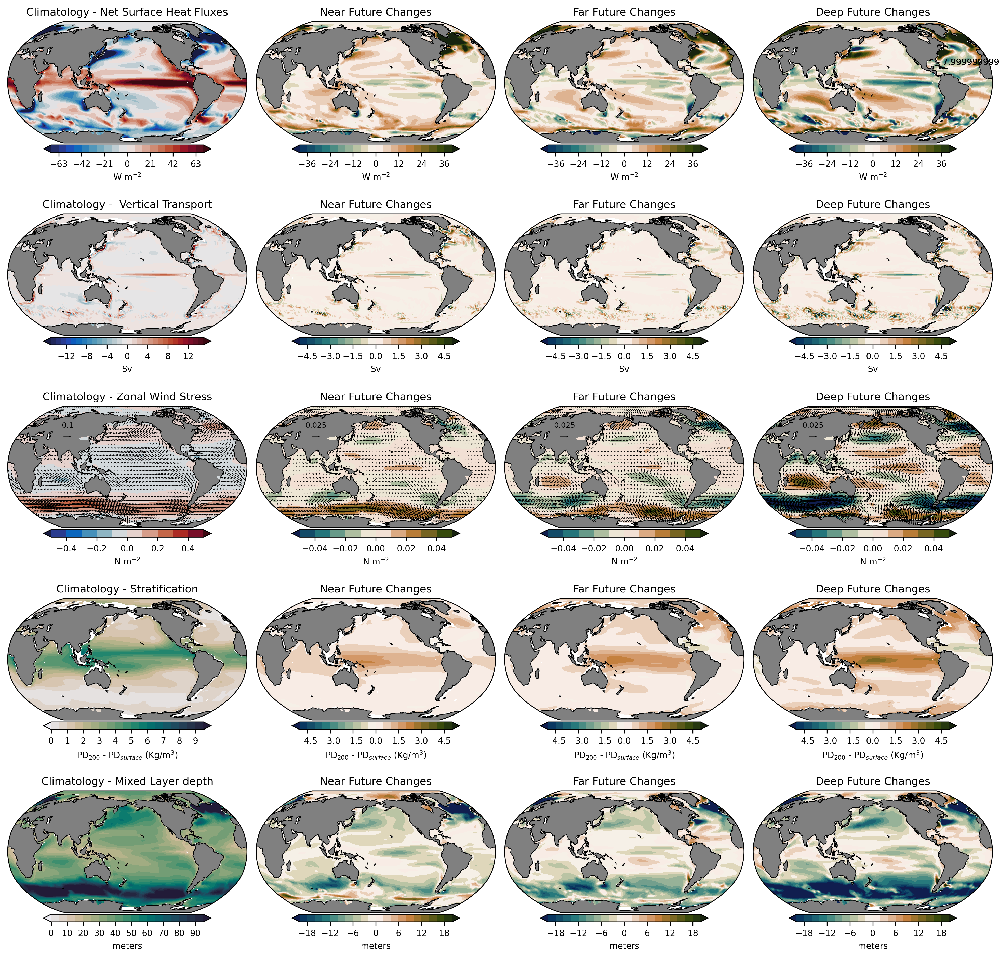

In [103]:
plt.rcParams.update({'font.size': 8})
fig,ax = plt.subplots(5,4,figsize=(17.5, 18), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

import cmocean
titles=['Climatology - Net Surface Heat Fluxes', 'Near Future Changes','Far Future Changes', 'Deep Future Changes',
        'Climatology -  Vertical Transport', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes', 
        'Climatology - Zonal Wind Stress', 'Near Future Changes', 'Far Future Changes','Deep Future Changes',
        'Climatology - Stratification', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes',
        'Climatology - Mixed Layer depth', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes']
fields=[ shf_hist_clim, shf_nfut, shf_ffut, shf_dfut,
         wvel_hist_clim100m, wvel_nfut_100m, wvel_ffut_100m, wvel_dfut_100m,
         taux_hist_clim, taux_nfut, taux_ffut, taux_dfut,
         pdGrad_hist_clim, pdGrad_nfut, pdGrad_ffut, pdGrad_dfut,
         hblt_hist_clim, hblt_nfut, hblt_ffut, hblt_dfut]
levels=[np.arange(-70,77,7), np.arange(-40,44,4),  np.arange(-40,44,4), np.arange(-40,44,4),
        np.arange(-15,16,1), np.arange(-5,5.5,0.5), np.arange(-5,5.5,0.5), np.arange(-5,5.5,0.5), 
        np.arange(-0.5,0.51,0.1), np.arange(-0.05,0.055,0.01), np.arange(-0.05,0.055,0.01), np.arange(-0.05,0.055,0.01),
        np.arange(0,10,0.5), np.arange(-5,5.5,0.5), np.arange(-5,5.5,0.5), np.arange(-5,5.5,0.5),
        np.arange(0,100,5), np.arange(-20,22,2), np.arange(-20,22,2), np.arange(-20,22,2)]
cbar=[cmocean.cm.balance, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r, 
      cmocean.cm.balance, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.balance, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r, 
      cmocean.cm.rain, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.rain, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r]
units=[ 'W m$^{-2}$', 'W m$^{-2}$', 'W m$^{-2}$', 'W m$^{-2}$',
       'Sv', 'Sv', 'Sv','Sv',
       'N m$^{-2}$', 'N m$^{-2}$', 'N m$^{-2}$','N m$^{-2}$',
       'PD$_{200}$ - PD$_{surface}$ (Kg/m$^{3}$)', 'PD$_{200}$ - PD$_{surface}$ (Kg/m$^{3}$)','PD$_{200}$ - PD$_{surface}$ (Kg/m$^{3}$)', 'PD$_{200}$ - PD$_{surface}$ (Kg/m$^{3}$)',
       'meters', 'meters', 'meters', 'meters']
for i,a in enumerate(tqdm_notebook(ax.flat)) :
    clabel=('%s'%units[i])
    cbar_kwargs={'orientation':'horizontal','pad':0.01,'shrink':0.7, 'label':clabel}
    fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    a.add_feature(cf.LAND,color='grey')
    a.coastlines(linewidth=0.6,color='black')
    a.set_global()  
    

for i,a in enumerate(ax.flat) :        
        if i==8 : 
            v1=tau_hist_clim.plot.quiver(ax=a, x='longitude',y='latitude', u='TAUX',v='TAUY', scale=3, color='#000000',width=0.002, transform=ccrs.PlateCarree())
            qk1=plt.quiverkey(v1,0.25,0.75,0.1,'0.1',labelpos='N',fontproperties={'size': 7})
        if i==9 : 
            v2=tau_nfut.plot.quiver(ax=a, x='longitude',y='latitude', u='TAUX',v='TAUY', scale=0.7, color='#000000',width=0.002, transform=ccrs.PlateCarree())
            qk2=plt.quiverkey(v2,0.25,0.75,0.025,'0.025',labelpos='N',fontproperties={'size': 7})
        if i==10 : 
            v3=tau_ffut.plot.quiver(ax=a, x='longitude',y='latitude', u='TAUX',v='TAUY', scale=0.7, color='#000000',width=0.002, transform=ccrs.PlateCarree())
            qk3=plt.quiverkey(v3,0.25,0.75,0.025,'0.025',labelpos='N',fontproperties={'size': 7})
        if i==11 : 
            v3=tau_dfut.plot.quiver(ax=a, x='longitude',y='latitude', u='TAUX',v='TAUY', scale=0.7, color='#000000',width=0.002, transform=ccrs.PlateCarree())
            qk3=plt.quiverkey(v3,0.25,0.75,0.025,'0.025',labelpos='N',fontproperties={'size': 7})



for i,a in enumerate(ax.flat) :
        a.set_title('%s'%titles[i], size=10) 
            
plt.tight_layout(rect=[0.15, 0.25, 0.90, 0.97])
plt.savefig('/proj/sahils/plots/python/ext_runs/4_panel_spatial_all-fields.png',dpi=500, bbox_inches = 'tight')

## Surface Heat Flux Changes

In [45]:
ds12=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/SHF_QSW_ocn_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds13=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/LWDN_F_ocn_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds14=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/LWUP_F_ocn_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds15=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/EVAP_F_ocn_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds16=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/SENH_F_ocn_MOAR_*.1x1_185001_250012.nc', combine='nested',concat_dim='concat_dim')

In [46]:
swfx  = ds12.SHF_QSW.groupby('time.year').mean('time').squeeze().load()
lwdn  = ds13.LWDN_F.groupby('time.year').mean('time').squeeze().load()
lwup  = ds14.LWUP_F.groupby('time.year').mean('time').squeeze().load()
lhfx  = ds15.EVAP_F.groupby('time.year').mean('time').squeeze().load()
snfx  = ds16.SENH_F.groupby('time.year').mean('time').squeeze().load()

In [47]:
#lwfx = lwup+lwdn
lhfx1 = lhfx*2.501e6

In [49]:
swfx_hist_clim   = swfx.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
swfx_nfut_clim   = swfx.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
swfx_ffut_clim   = swfx.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
swfx_dfut_clim   = swfx.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

swfx_nfut = swfx_nfut_clim - swfx_hist_clim
swfx_ffut = swfx_ffut_clim - swfx_nfut_clim
swfx_dfut = swfx_dfut_clim - swfx_nfut_clim 
############################################################################################################################################
lwup_hist_clim   = lwup.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
lwup_nfut_clim   = lwup.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
lwup_ffut_clim   = lwup.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
lwup_dfut_clim   = lwup.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

lwup_nfut = lwup_nfut_clim - lwup_hist_clim
lwup_ffut = lwup_ffut_clim - lwup_nfut_clim 
lwup_dfut = lwup_dfut_clim - lwup_nfut_clim 
############################################################################################################################################
lwdn_hist_clim   = lwdn.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
lwdn_nfut_clim   = lwdn.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
lwdn_ffut_clim   = lwdn.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
lwdn_dfut_clim   = lwdn.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

lwdn_nfut = lwdn_nfut_clim - lwdn_hist_clim
lwdn_ffut = lwdn_ffut_clim - lwdn_nfut_clim 
lwdn_dfut = lwdn_dfut_clim - lwdn_nfut_clim 
############################################################################################################################################
lhfx_hist_clim   = lhfx1.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
lhfx_nfut_clim   = lhfx1.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
lhfx_ffut_clim   = lhfx1.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
lhfx_dfut_clim   = lhfx1.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

lhfx_nfut = lhfx_nfut_clim - lhfx_hist_clim
lhfx_ffut = lhfx_ffut_clim - lhfx_nfut_clim 
lhfx_dfut = lhfx_dfut_clim - lhfx_nfut_clim 
############################################################################################################################################
snfx_hist_clim   = snfx.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
snfx_nfut_clim   = snfx.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
snfx_ffut_clim   = snfx.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
snfx_dfut_clim   = snfx.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

snfx_nfut = snfx_nfut_clim - snfx_hist_clim
snfx_ffut = snfx_ffut_clim - snfx_nfut_clim
snfx_dfut = snfx_dfut_clim - snfx_nfut_clim 


  0%|          | 0/20 [00:00<?, ?it/s]

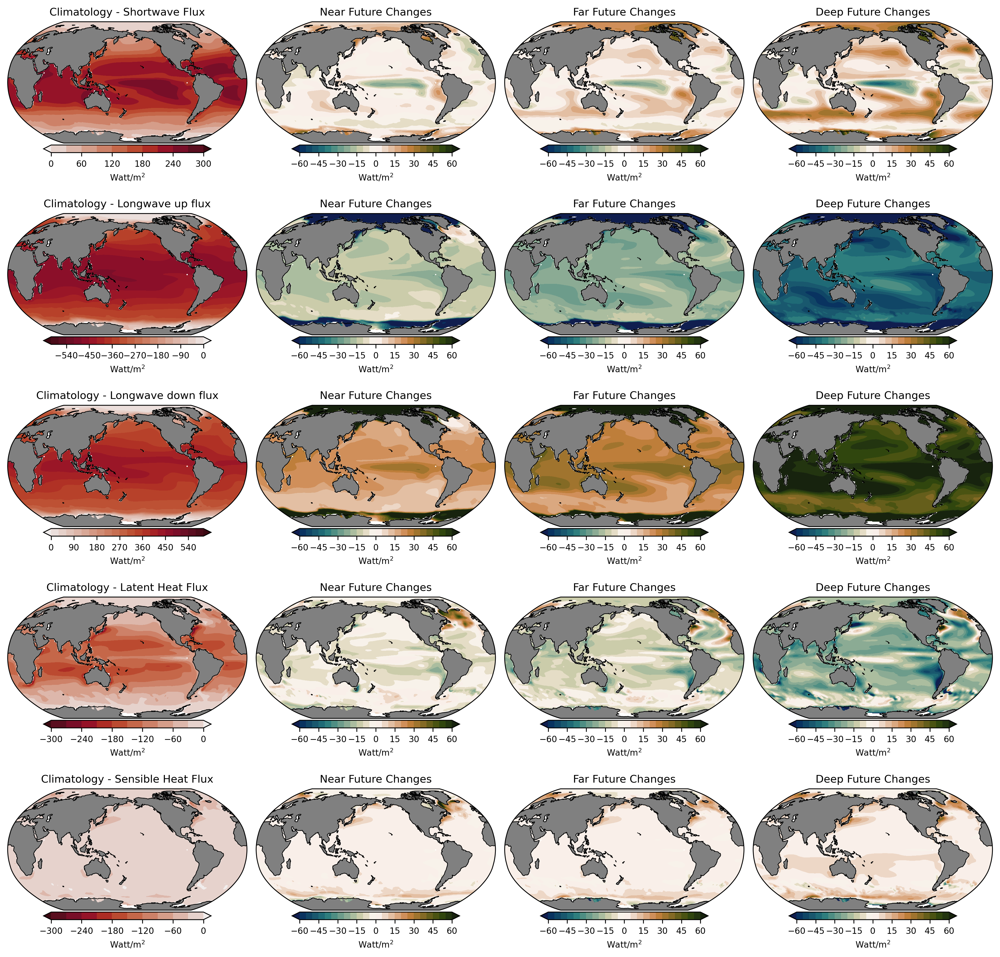

In [101]:
plt.rcParams.update({'font.size': 8})
fig,ax = plt.subplots(5,4,figsize=(17.5, 18), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

import cmocean
titles=['Climatology - Shortwave Flux', 'Near Future Changes','Far Future Changes', 'Deep Future Changes',
        'Climatology - Longwave up flux', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes', 
        'Climatology - Longwave down flux', 'Near Future Changes', 'Far Future Changes','Deep Future Changes',
        'Climatology - Latent Heat Flux', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes',
        'Climatology - Sensible Heat Flux', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes']
fluxes=[swfx_hist_clim, swfx_nfut, swfx_ffut, swfx_dfut, 
        lwup_hist_clim, lwup_nfut, lwup_ffut, lwup_dfut,
        lwdn_hist_clim, lwdn_nfut, lwdn_ffut, lwdn_dfut,
        lhfx_hist_clim, lhfx_nfut, lhfx_ffut, lhfx_dfut,
        snfx_hist_clim, snfx_nfut, snfx_ffut, snfx_dfut]

levels=[np.arange(0,330,30), np.arange(-60,65,5), np.arange(-60,65,5),  np.arange(-60,65,5),
        np.arange(-600,30,30), np.arange(-60,65,5), np.arange(-60,65,5),  np.arange(-60,65,5),
        np.arange(0,630,30), np.arange(-60,65,5), np.arange(-60,65,5),  np.arange(-60,65,5),
        np.arange(-300,30,30), np.arange(-60,65,5), np.arange(-60,65,5),  np.arange(-60,65,5), 
        np.arange(-300,30,30), np.arange(-60,65,5), np.arange(-60,65,5),  np.arange(-60,65,5)] 
cbar=[cmocean.cm.amp, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r]
for i,a in enumerate(tqdm_notebook(ax.flat)) :
    cbar_kwargs={'orientation':'horizontal','pad':0.01,'shrink':0.7, 'label':'Watt/m$^{2}$'}
    fluxes[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    #lwfx[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    a.add_feature(cf.LAND,color='grey')
    a.coastlines(linewidth=0.6,color='black')
    a.set_global()  
    
for i,a in enumerate(ax.flat) :
        a.set_title('%s'%titles[i], size=10) 
            
plt.tight_layout(rect=[0.15, 0.25, 0.90, 0.97])

plt.savefig('/proj/sahils/plots/python/ext_runs/4_panel_spatial_fluxes.png',dpi=500, bbox_inches = 'tight')

# Cloud Cover Changes

In [68]:
ds17=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/CLDTOT_atm_MOAR_*.185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds18=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/CLDLOW_atm_MOAR_*.185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds19=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/CLDMED_atm_MOAR_*.185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds20=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/CLDHGH_atm_MOAR_*.185001_250012.nc', combine='nested',concat_dim='concat_dim')

In [69]:
cldtot  = ds17.CLDTOT.groupby('time.year').mean('time').squeeze().load()
cldlow  = ds18.CLDLOW.groupby('time.year').mean('time').squeeze().load()
cldmed  = ds19.CLDMED.groupby('time.year').mean('time').squeeze().load()
cldhgh  = ds20.CLDHGH.groupby('time.year').mean('time').squeeze().load()


In [70]:
cldtot_hist_clim   = cldtot.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
cldtot_nfut_clim   = cldtot.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
cldtot_ffut_clim   = cldtot.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
cldtot_dfut_clim   = cldtot.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

cldtot_nfut = cldtot_nfut_clim - cldtot_hist_clim
cldtot_ffut = cldtot_ffut_clim - cldtot_nfut_clim
cldtot_dfut = cldtot_dfut_clim - cldtot_nfut_clim 
################################################################################################
cldlow_hist_clim   = cldlow.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
cldlow_nfut_clim   = cldlow.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
cldlow_ffut_clim   = cldlow.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
cldlow_dfut_clim   = cldlow.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

cldlow_nfut = cldlow_nfut_clim - cldlow_hist_clim
cldlow_ffut = cldlow_ffut_clim - cldlow_nfut_clim
cldlow_dfut = cldlow_dfut_clim - cldlow_nfut_clim 
################################################################################################
cldmed_hist_clim   = cldmed.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
cldmed_nfut_clim   = cldmed.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
cldmed_ffut_clim   = cldmed.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
cldmed_dfut_clim   = cldmed.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

cldmed_nfut = cldmed_nfut_clim - cldmed_hist_clim
cldmed_ffut = cldmed_ffut_clim - cldmed_nfut_clim
cldmed_dfut = cldmed_dfut_clim - cldmed_nfut_clim 
################################################################################################
cldhgh_hist_clim   = cldhgh.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
cldhgh_nfut_clim   = cldhgh.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
cldhgh_ffut_clim   = cldhgh.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
cldhgh_dfut_clim   = cldhgh.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

cldhgh_nfut = cldhgh_nfut_clim - cldhgh_hist_clim
cldhgh_ffut = cldhgh_ffut_clim - cldhgh_nfut_clim
cldhgh_dfut = cldhgh_dfut_clim - cldhgh_nfut_clim 


  0%|          | 0/16 [00:00<?, ?it/s]

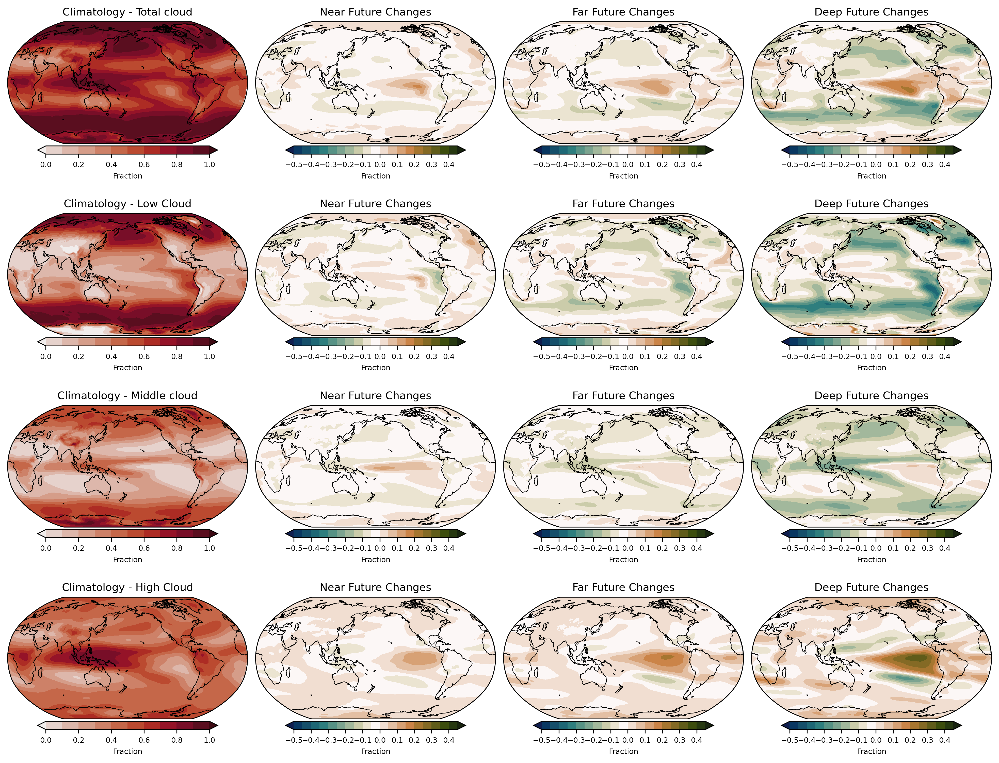

In [102]:
plt.rcParams.update({'font.size': 7})
fig,ax = plt.subplots(4,4,figsize=(17.5, 18), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

import cmocean
titles=['Climatology - Total cloud', 'Near Future Changes','Far Future Changes', 'Deep Future Changes',
        'Climatology - Low Cloud', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes', 
        'Climatology - Middle cloud', 'Near Future Changes', 'Far Future Changes','Deep Future Changes',
        'Climatology - High Cloud', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes']
fields=[cldtot_hist_clim, cldtot_nfut, cldtot_ffut, cldtot_dfut, 
        cldlow_hist_clim, cldlow_nfut, cldlow_ffut, cldlow_dfut,
        cldmed_hist_clim, cldmed_nfut, cldmed_ffut, cldmed_dfut,
        cldhgh_hist_clim, cldhgh_nfut, cldhgh_ffut, cldhgh_dfut]
levels=[np.arange(0,1.1,0.1), np.arange(-0.5,0.5,0.05), np.arange(-0.5,0.5,0.05),  np.arange(-0.5,0.5,0.05),
        np.arange(0,1.1,0.1), np.arange(-0.5,0.5,0.05), np.arange(-0.5,0.5,0.05),  np.arange(-0.5,0.5,0.05),
        np.arange(0,1.1,0.1), np.arange(-0.5,0.5,0.05), np.arange(-0.5,0.5,0.05),  np.arange(-0.5,0.5,0.05),
        np.arange(0,1.1,0.1), np.arange(-0.5,0.5,0.05), np.arange(-0.5,0.5,0.05),  np.arange(-0.5,0.5,0.05)]
cbar=[cmocean.cm.amp, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r]
for i,a in enumerate(tqdm_notebook(ax.flat)) :
    cbar_kwargs={'orientation':'horizontal','pad':0.01,'shrink':0.75, 'label':'Fraction'}
    fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    a.add_feature(cf.LAND,color='grey')
    a.coastlines(linewidth=0.6,color='black')
    a.set_global()  
    
for i,a in enumerate(ax.flat) :
        a.set_title('%s'%titles[i], size=10) 


plt.tight_layout(rect=[0.15, 0.36, 0.90, 0.97])

plt.savefig('/proj/sahils/plots/python/ext_runs/4_panel_spatial_clouds.png',dpi=500, bbox_inches = 'tight')

# Cloud Forcing

In [107]:
ds21=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/SWCF_atm_MOAR_*.185001_250012.nc', combine='nested',concat_dim='concat_dim')
ds22=xr.open_mfdataset('/proj/krodgers/CESM/SCRATCH_CESM2_LE/EXTENSION_2500/LWCF_atm_MOAR_*.185001_250012.nc', combine='nested',concat_dim='concat_dim')

In [108]:
swcf  = ds21.SWCF.groupby('time.year').mean('time').squeeze().load()
lwcf  = ds22.LWCF.groupby('time.year').mean('time').squeeze().load()

In [109]:
swcf_hist_clim   = swcf.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
swcf_nfut_clim   = swcf.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
swcf_ffut_clim   = swcf.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
swcf_dfut_clim   = swcf.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

swcf_nfut = swcf_nfut_clim - swcf_hist_clim
swcf_ffut = swcf_ffut_clim - swcf_nfut_clim
swcf_dfut = swcf_dfut_clim - swcf_nfut_clim 
################################################################################################
lwcf_hist_clim   = lwcf.sel(year=slice(str(1950),str(2000))).mean('year').mean('concat_dim').squeeze()
lwcf_nfut_clim   = lwcf.sel(year=slice(str(2050),str(2100))).mean('year').mean('concat_dim').squeeze()
lwcf_ffut_clim   = lwcf.sel(year=slice(str(2120),str(2200))).mean('year').mean('concat_dim').squeeze()
lwcf_dfut_clim   = lwcf.sel(year=slice(str(2300),str(2500))).mean('year').mean('concat_dim').squeeze()

lwcf_nfut = lwcf_nfut_clim - lwcf_hist_clim
lwcf_ffut = lwcf_ffut_clim - lwcf_nfut_clim
lwcf_dfut = lwcf_dfut_clim - lwcf_nfut_clim 

  0%|          | 0/8 [00:00<?, ?it/s]

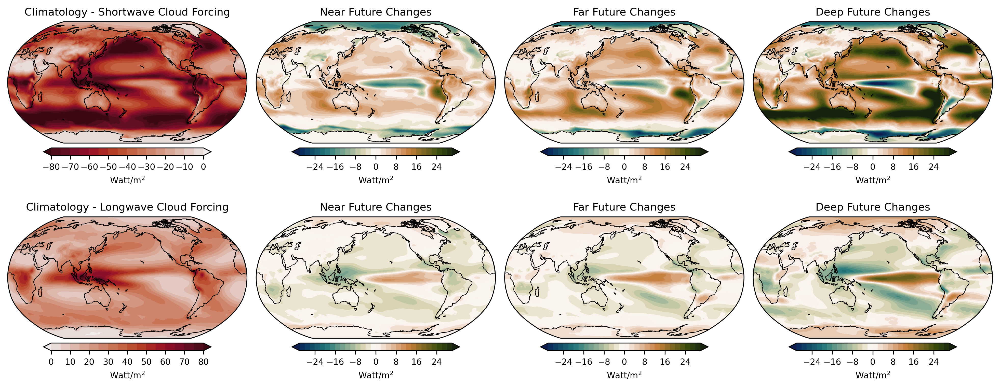

In [119]:
plt.rcParams.update({'font.size': 8})
fig,ax = plt.subplots(2,4,figsize=(17.5, 18), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

import cmocean
titles=['Climatology - Shortwave Cloud Forcing', 'Near Future Changes','Far Future Changes', 'Deep Future Changes',
        'Climatology - Longwave Cloud Forcing', 'Near Future Changes', 'Far Future Changes', 'Deep Future Changes']
fluxes=[swcf_hist_clim, swcf_nfut, swcf_ffut, swcf_dfut, 
        lwcf_hist_clim, lwcf_nfut, lwcf_ffut, lwcf_dfut]

levels=[np.arange(-80,5,5), np.arange(-30,32,2), np.arange(-30,32,2),  np.arange(-30,32,2),
        np.arange(0,85,5), np.arange(-30,32,2), np.arange(-30,32,2),  np.arange(-30,32,2)] 
cbar=[cmocean.cm.amp_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r,
      cmocean.cm.amp, cmocean.cm.tarn_r, cmocean.cm.tarn_r, cmocean.cm.tarn_r]
for i,a in enumerate(tqdm_notebook(ax.flat)) :
    cbar_kwargs={'orientation':'horizontal','pad':0.01,'shrink':0.7, 'label':'Watt/m$^{2}$'}
    fluxes[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    #lwfx[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    a.add_feature(cf.LAND,color='grey')
    a.coastlines(linewidth=0.6,color='black')
    a.set_global()  
    
for i,a in enumerate(ax.flat) :
        a.set_title('%s'%titles[i], size=10) 
            
plt.tight_layout(rect=[0.15, 0.46, 0.90, 0.97])

plt.savefig('/proj/sahils/plots/python/ext_runs/4_panel_spatial_cloud-forcings.png',dpi=500, bbox_inches = 'tight')